# Make the wrapping optical flow image

In [1]:
import flowpy
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
flow = flowpy.flow_read("25_201703061606_31745_32026/25_201703061606_31745_32026_3571.png")

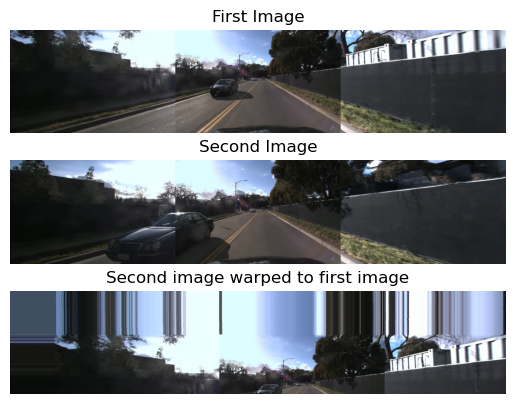

In [5]:
flow = flowpy.flow_read("25_201703061606_31745_32026/25_201703061606_31745_32026_3601.png")
img_1 = np.asarray(Image.open("25_201703061606_31745_32026/25_201703061606_31745_32026_3571.png"))
img_2 = np.asarray(Image.open("25_201703061606_31745_32026/25_201703061606_31745_32026_3581.png"))
img_3 = np.asarray(Image.open("25_201703061606_31745_32026/25_201703061606_31745_32026_3591.png"))
img_sagat = np.asarray(Image.open("25_201703061606_31745_32026/25_201703061606_31745_32026_3601.png"))


flow[np.isnan(flow)] = 0
warped_image = flowpy.backward_warp(img_3, flow)

fig, axes = plt.subplots(3, 1)
for ax, image, title in zip(axes, (img_3, img_sagat, warped_image),
                            ("First Image", "Second Image", "Second image warped to first image")):
    ax.imshow(image)
    ax.set_title(title)
    ax.set_axis_off()

plt.show()


In [6]:
import cv2
from PIL import Image

ModuleNotFoundError: No module named 'cv2'

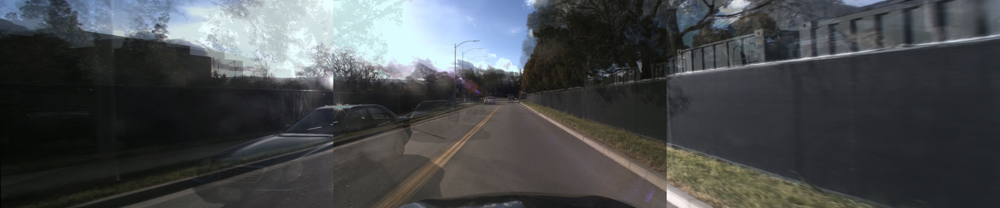

In [15]:
from PIL import Image

img_1 = Image.open("25_201703061606_31745_32026/25_201703061606_31745_32026_3571.png").convert("RGBA")
img_2 = Image.open("25_201703061606_31745_32026/25_201703061606_31745_32026_3581.png").convert("RGBA")
img_3 = Image.open("25_201703061606_31745_32026/25_201703061606_31745_32026_3591.png").convert("RGBA")
img_sagat = Image.open("25_201703061606_31745_32026/25_201703061606_31745_32026_3601.png").convert("RGBA")

blend_1 = Image.blend(img_1, img_2, 0.5)
blend_2= Image.blend(blend_1,img_3, 0.5)
blend_3= Image.blend(blend_2, img_sagat, 0.5)

blend_3
# new_img.save("new.png","PNG")